In [ ]:
!pip install git+https://github.com/tensorflow/examples.git
!pip install --upgrade tfds-nightly
!pip install tensorflow_addons

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix
import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
from tensorflow.keras.callbacks import History
import numpy as np
import re
import math
import random
import cv2

In [ ]:
device_name = tf.test.gpu_device_name()
AUTOTUNE = tf.data.AUTOTUNE
print('Found GPU at: {}'.format(device_name))

In [4]:
# getting the dataset
dataset, metadata = tfds.load('cycle_gan/vangogh2photo',
                              with_info=True, as_supervised=True)

train_plain_image, train_style_image = dataset['trainB'], dataset['trainA']
test_plain_image, test_style_image = dataset['testB'], dataset['testA']

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/4 [00:00<?, ? splits/s]

Generating trainA examples...:   0%|          | 0/400 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0.incompleteR80CHP/cycle_gan-trainA.tfrecord*.…

Generating trainB examples...:   0%|          | 0/6287 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0.incompleteR80CHP/cycle_gan-trainB.tfrecord*.…

Generating testA examples...:   0%|          | 0/400 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0.incompleteR80CHP/cycle_gan-testA.tfrecord*..…

Generating testB examples...:   0%|          | 0/751 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0.incompleteR80CHP/cycle_gan-testB.tfrecord*..…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/vangogh2photo/3.0.0. Subsequent calls will reuse this data.


In [5]:
BUFFER_SIZE = 1000
BATCH_SIZE = 4
IMG_WIDTH = 256
IMG_HEIGHT = 256
INPUT_SHAPE = (256, 256, 3)
OUTPUT_CHANNELS = 3
LAMBDA = 10
EPOCHS = 100

In [6]:
# adding different types of noises to the input images
def add_gaussian_noise(image, stddev=0.01**0.5):
    image = tf.cast(image, tf.float32)
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=stddev, dtype=tf.float32)
    noisy_image = image + noise
    return noisy_image

def random_image_augmentation(image):
  image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  image = tf.image.stateless_random_crop(
        image,
        size=[IMG_HEIGHT, IMG_WIDTH, 3],
        seed=tf.random.experimental.stateless_split([1, 2], num=1)[0]
    )
  image = tf.image.random_flip_left_right(image)

  return image

def preprocess_image_train(image, label):
  # image = random_image_augmentation(image)   # Adding ranom jitter noise
  image = add_gaussian_noise(image)  # Adding Gaussian noise
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1

  return image

def preprocess_image_test(image, label):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image



In [ ]:
# test_plain_image = test_plain_image.map(
#     preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(BATCH_SIZE)
# test_style_image = test_style_image.map(
#     preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(BATCH_SIZE)

In [7]:
def prepare_dataset(dataset, training=True):
    if training:
        return (dataset.cache()
                .map(preprocess_image_train, num_parallel_calls=AUTOTUNE)
                .shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE))
    else:
        return (dataset.map(preprocess_image_test, num_parallel_calls=AUTOTUNE)
                .cache()
                .shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE))

In [8]:
train_plain_image = prepare_dataset(train_plain_image, training=True)
train_style_image = prepare_dataset(train_style_image, training=True)
test_plain_image = prepare_dataset(test_plain_image, training=False)
test_style_image = prepare_dataset(test_style_image, training=False)

In [23]:
sample_pi = next(iter(train_plain_image))
sample_si = next(iter(train_style_image))

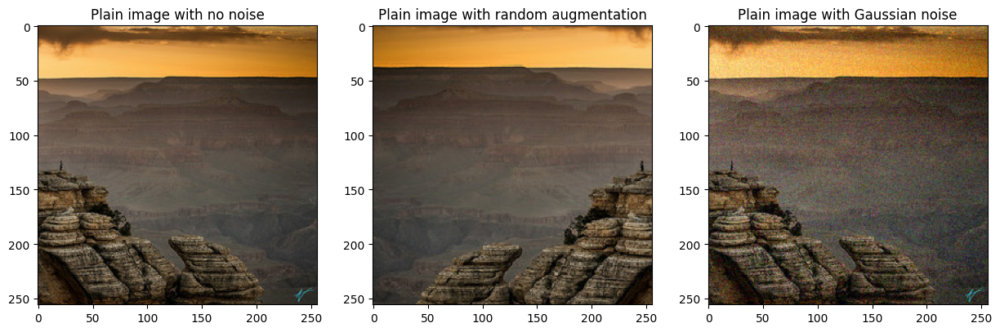

In [ ]:
# getting sample image and impact of noise on them
sample_pi = next(iter(test_plain_image))
sample_si = next(iter(test_style_image))
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Plain image with no noise')
plt.imshow(sample_pi[0] * 0.5 + 0.5)

plt.subplot(132)
plt.title('Plain image with random augmentation')
plt.imshow(random_image_augmentation(sample_pi[0]) * 0.5 + 0.5)

plt.subplot(133)
plt.title('Plain image with Gaussian noise')
plt.imshow(add_gaussian_noise(sample_pi[0]) * 0.5 + 0.5)

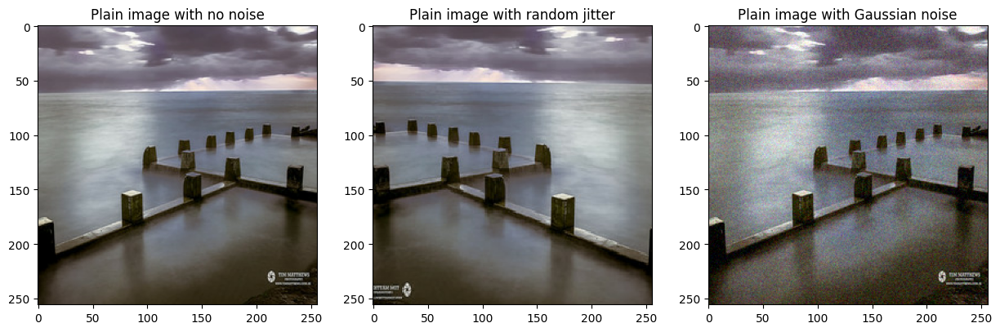

In [11]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Plain image with no noise')
plt.imshow(sample_pi[0] * 0.5 + 0.5)

plt.subplot(132)
plt.title('Plain image with random jitter')
plt.imshow(random_image_augmentation(sample_pi[0]) * 0.5 + 0.5)

plt.subplot(133)
plt.title('Plain image with Gaussian noise')
plt.imshow(add_gaussian_noise(sample_pi[0]) * 0.5 + 0.5)

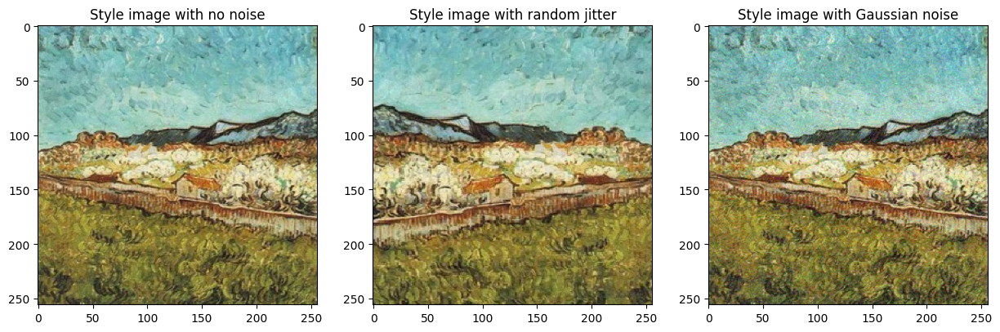

In [19]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Style image with no noise')
plt.imshow(sample_si[0] * 0.5 + 0.5)

plt.subplot(132)
plt.title('Style image with random jitter')
plt.imshow(random_image_augmentation(sample_si[0]) * 0.5 + 0.5)

plt.subplot(133)
plt.title('Style image with Gaussian noise')
plt.imshow(add_gaussian_noise(sample_si[0]) * 0.5 + 0.5)

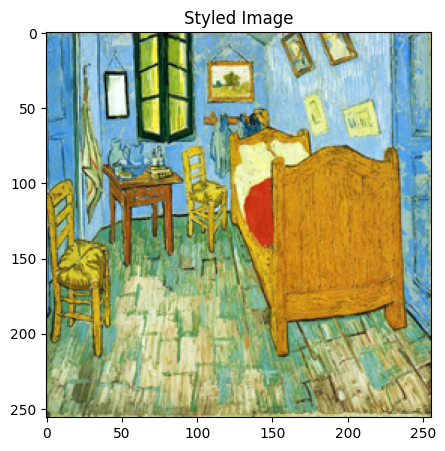

In [22]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Styled Image')
plt.imshow(sample_si[0] * 0.5 + 0.5)

In [24]:
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential([
        layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False),
    ])

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)


    result = keras.Sequential([
        layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer=initializer,use_bias=False)])

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

In [25]:
# defining the generator and discriminator of cycleGAN model
def Generator():

    inputs = layers.Input(shape=[256,256,3])
    initializer = tf.random_normal_initializer(0., 0.02)

    # Downsampling
    x = downsample(64, 4, apply_instancenorm=False)(inputs)
    x1 = downsample(128, 4)(x)
    x2 = downsample(256, 4)(x1)
    x3 = downsample(512, 4)(x2)
    x4 = downsample(512, 4)(x3)
    x5 = downsample(512, 4)(x4)
    x6 = downsample(512, 4)(x5)
    x7 = downsample(512, 4)(x6)

    # Upsampling with skip connections
    x = upsample(512, 4, apply_dropout=True)(x7)
    x = layers.Concatenate()([x, x6])
    x = upsample(512, 4, apply_dropout=True)(x)
    x = layers.Concatenate()([x, x5])
    x = upsample(512, 4, apply_dropout=True)(x)
    x = layers.Concatenate()([x, x4])
    x = upsample(512, 4)(x)
    x = layers.Concatenate()([x, x3])
    x = upsample(256, 4)(x)
    x = layers.Concatenate()([x, x2])
    x = upsample(128, 4)(x)
    x = layers.Concatenate()([x, x1])
    x = upsample(64, 4)(x)

    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')
    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)



def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    # Downsampling
    x = downsample(64, 4, False)(inp)
    x = downsample(128, 4)(x)
    x = downsample(256, 4)(x)

    x = layers.ZeroPadding2D()(x)

    x = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(x)

    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(x)
    x = layers.LeakyReLU()(x)

    x = layers.ZeroPadding2D()(x)
    x = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x)

    return tf.keras.Model(inputs=inp, outputs=x)

In [26]:
generator_g = Generator()
generator_f = Generator()

discriminator_x = Discriminator()
discriminator_y = Discriminator()

In [27]:
# various loss functions
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(real, generated):
  total_disc_loss = loss_obj(tf.ones_like(real), real) + loss_obj(tf.zeros_like(generated), generated)
  return total_disc_loss * 0.5

def generator_loss(generated_list):
  return [loss_obj(tf.ones_like(generated), generated) for generated in generated_list]

def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss



In [28]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [29]:
from google.colab import drive
drive.mount('/content/drive')
checkpoint_path = "/content/drive/My Drive/cv_kaggle_assignment/tf_checkpoints/"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored.')

Mounted at /content/drive
Latest checkpoint restored.


In [30]:
# function to generate output after doing a forward pass of our generator
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')

  plt.show()
  plt.savefig('your_image.png')

In [31]:
@tf.function
def train_step(real_x, real_y):

  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculating the losses
    gen_g_loss, gen_f_loss = generator_loss([disc_fake_y, disc_fake_x])

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)


    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # calculating the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

  # applying the gradient to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))
  # returning all the losses
  return {
    'total_gen_g_loss': total_gen_g_loss,
    'total_gen_f_loss': total_gen_f_loss,
    'disc_x_loss': disc_x_loss,
    'disc_y_loss': disc_y_loss,
    'total_cycle_loss': total_cycle_loss
  }

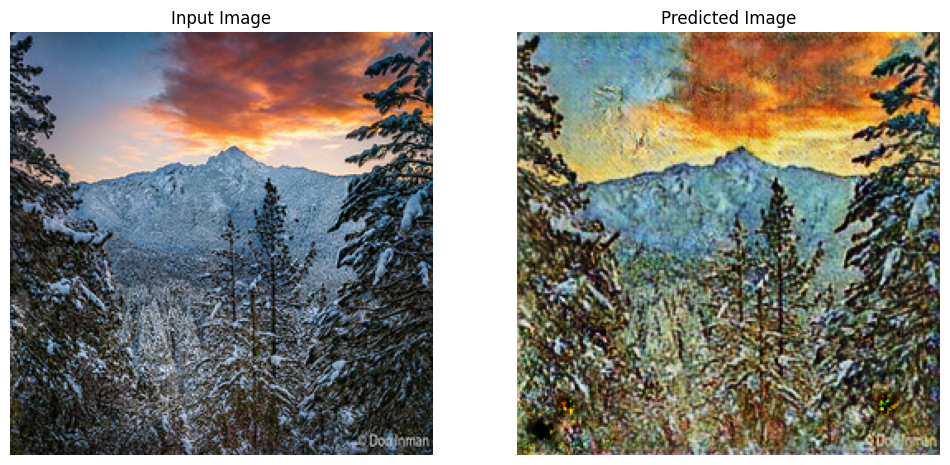

Time taken for epoch 98 is 203.86061573028564 sec

Losses for epoch 98
total_gen_g_loss: 4.116738319396973
total_gen_f_loss: 4.535439968109131
disc_x_loss: 0.7273072600364685
disc_y_loss: 0.4857938885688782
total_cycle_loss: 2.491936206817627


<Figure size 640x480 with 0 Axes>

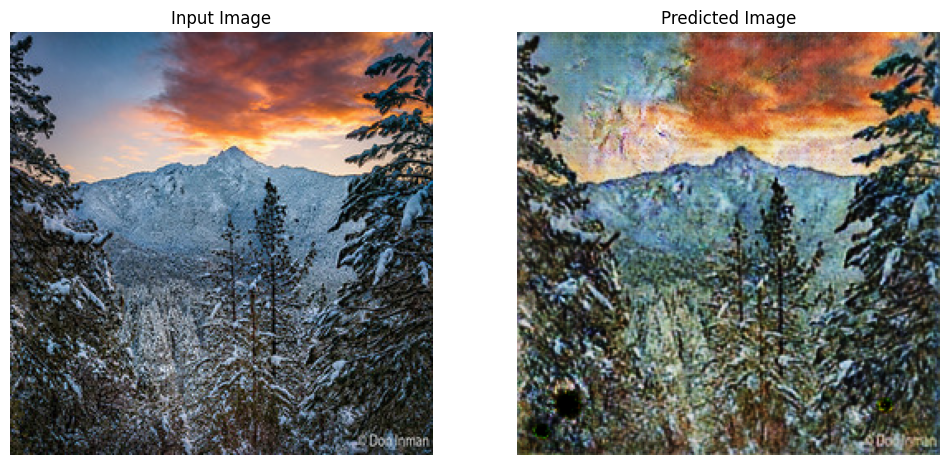

Time taken for epoch 99 is 86.34705400466919 sec

Losses for epoch 99
total_gen_g_loss: 4.060047626495361
total_gen_f_loss: 3.7676455974578857
disc_x_loss: 0.5440474152565002
disc_y_loss: 0.5965723991394043
total_cycle_loss: 2.515212059020996


Saving checkpoint for epoch 3 at /content/drive/My Drive/cv_kaggle_assignment/tf_checkpoints/ckpt-32


<Figure size 640x480 with 0 Axes>

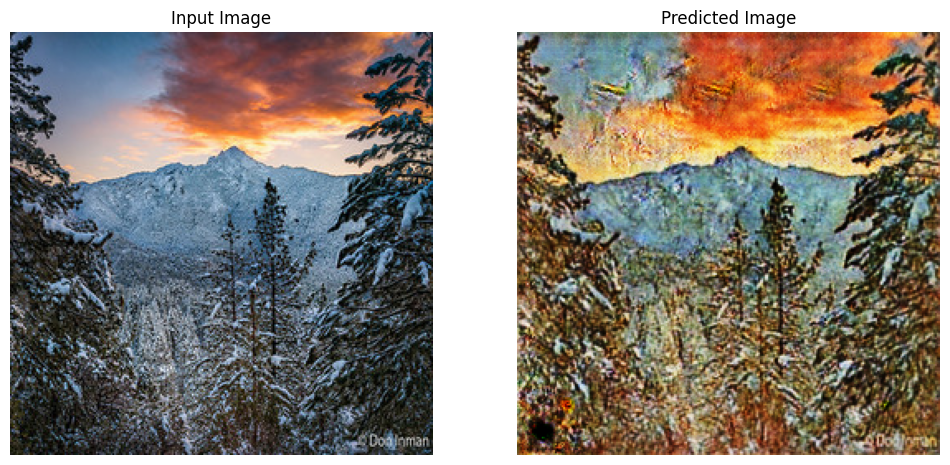

Time taken for epoch 100 is 102.16340065002441 sec

Losses for epoch 100
total_gen_g_loss: 3.527015209197998
total_gen_f_loss: 3.3242573738098145
disc_x_loss: 0.6703884601593018
disc_y_loss: 0.46991977095603943
total_cycle_loss: 2.0347323417663574


<Figure size 640x480 with 0 Axes>

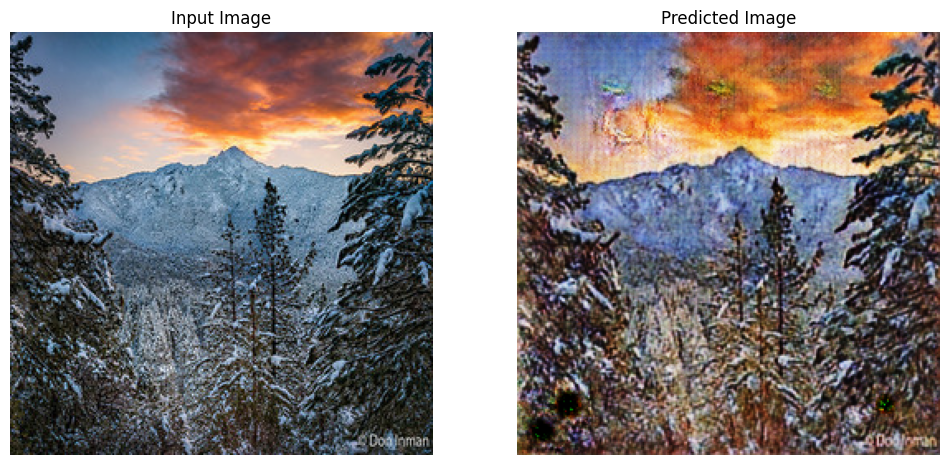

Time taken for epoch 101 is 88.80175447463989 sec

Losses for epoch 101
total_gen_g_loss: 3.5008811950683594
total_gen_f_loss: 3.812272548675537
disc_x_loss: 0.6643820405006409
disc_y_loss: 0.6012074947357178
total_cycle_loss: 2.238652229309082


<Figure size 640x480 with 0 Axes>

In [33]:
total_gen_g_loss_values = []
total_gen_f_loss_values = []
disc_x_loss_values = []
disc_y_loss_values = []
total_cycle_loss_values = []

# running all the epochs
for epoch in range(EPOCHS):
  start = time.time()

  # n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_plain_image, train_style_image)):
    losses = train_step(image_x, image_y)
    # if n % 10 == 0:
    #   print ('.', end='')
    # n += 1

  if (epoch + 1) % 3 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
  if (epoch + 1) % 10 ==0:
    fp = "/content/drive/My Drive/cv_kaggle_assignment/gaussian_noise_{}.h5".format(epoch+1)
    generator_g.save(fp)


  generate_images(generator_g, sample_pi)
  total_gen_g_loss_values.append(losses['total_gen_g_loss'])
  total_gen_f_loss_values.append(losses['total_gen_f_loss'])
  disc_x_loss_values.append(losses['disc_x_loss'])
  disc_y_loss_values.append(losses['disc_y_loss'])
  total_cycle_loss_values.append(losses['total_cycle_loss'])

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))
  print('Losses for epoch {}'.format(epoch+1))
  for loss_name, loss_value in losses.items():
    print(f'{loss_name}: {loss_value}')

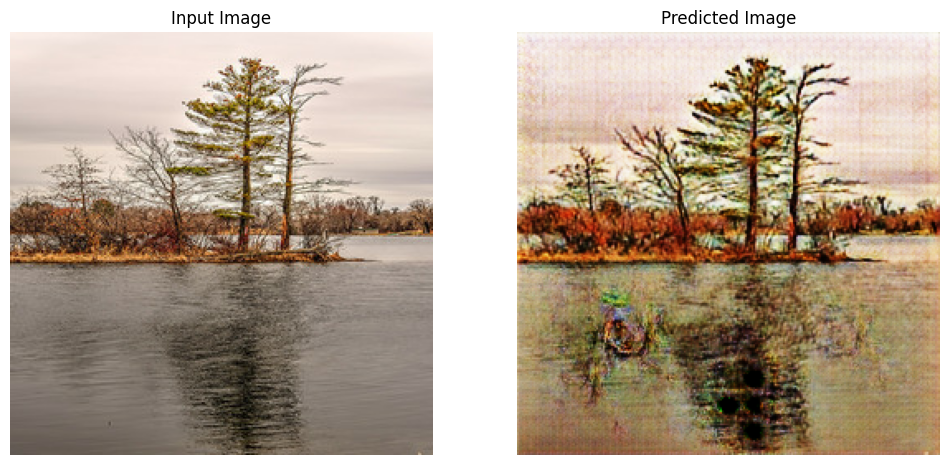

<Figure size 640x480 with 0 Axes>

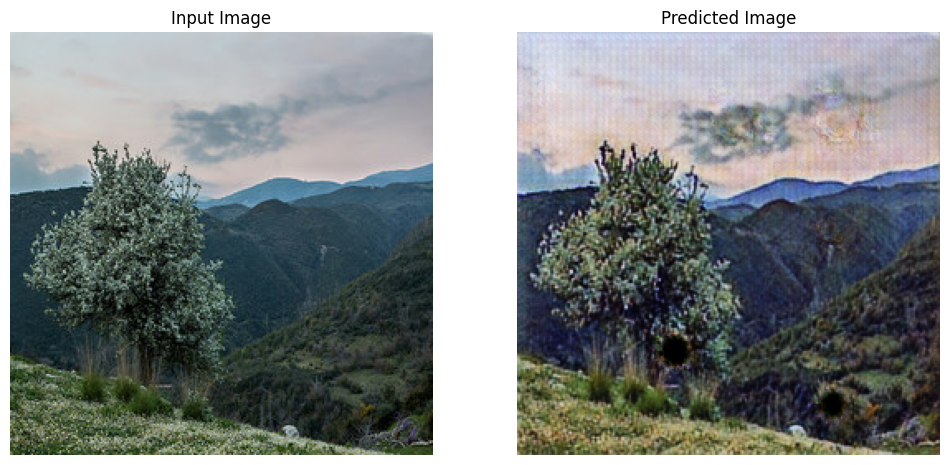

<Figure size 640x480 with 0 Axes>

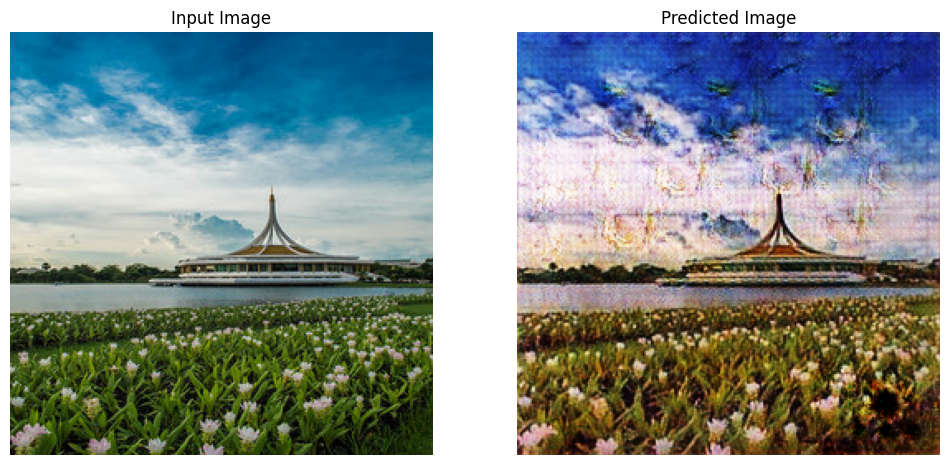

<Figure size 640x480 with 0 Axes>

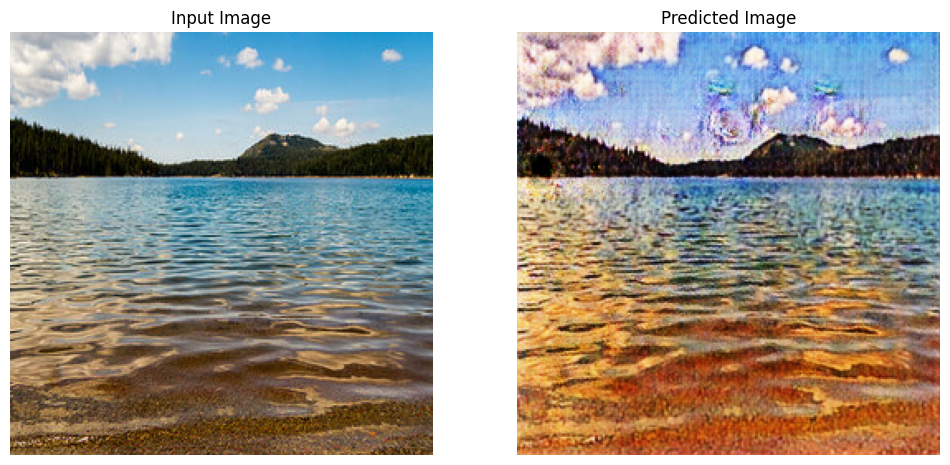

<Figure size 640x480 with 0 Axes>

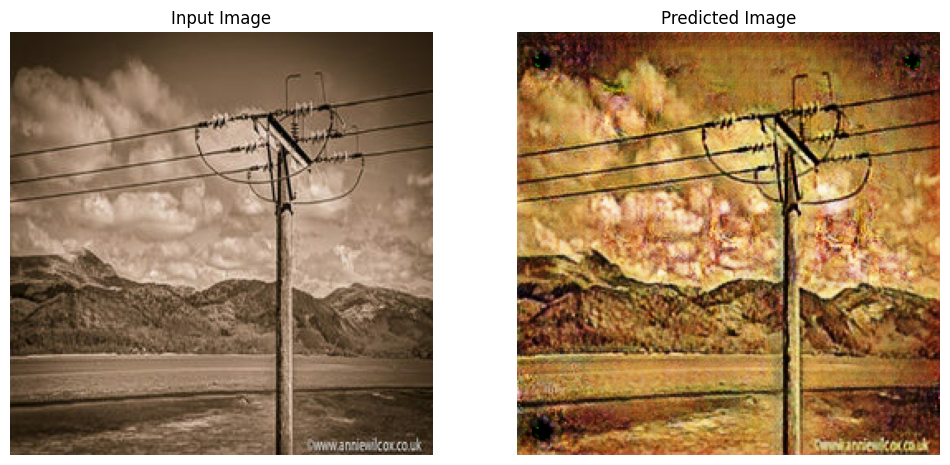

<Figure size 640x480 with 0 Axes>

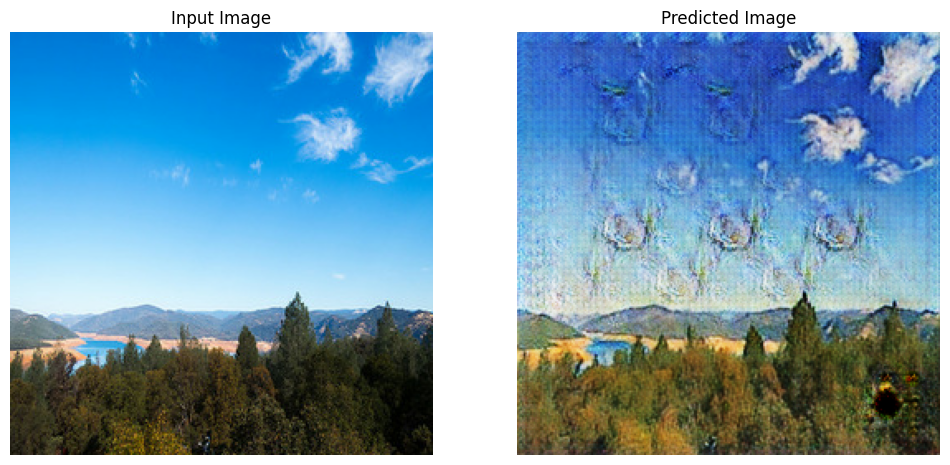

<Figure size 640x480 with 0 Axes>

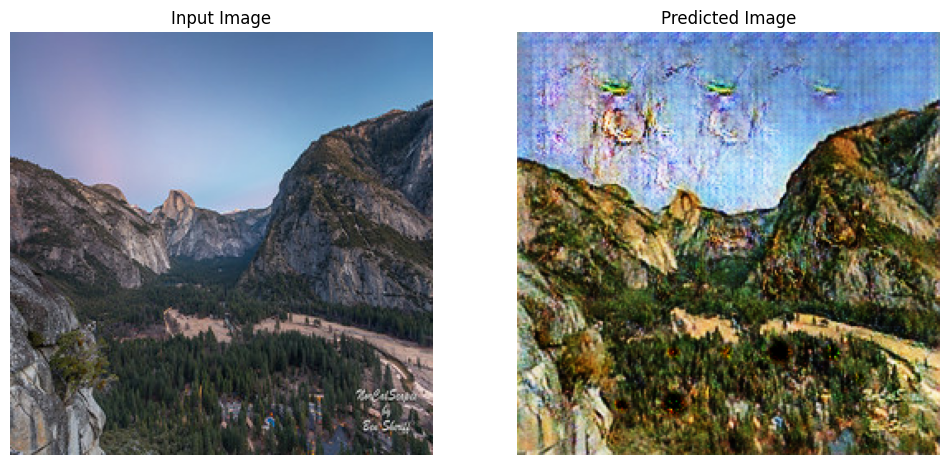

<Figure size 640x480 with 0 Axes>

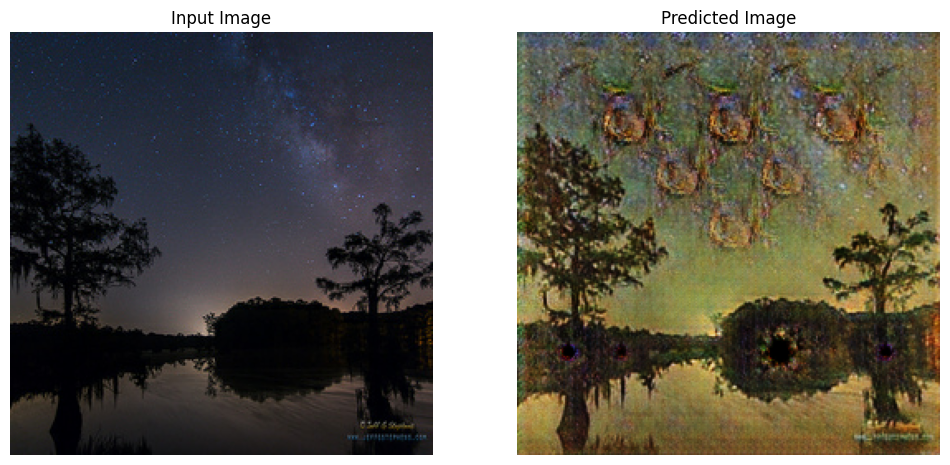

<Figure size 640x480 with 0 Axes>

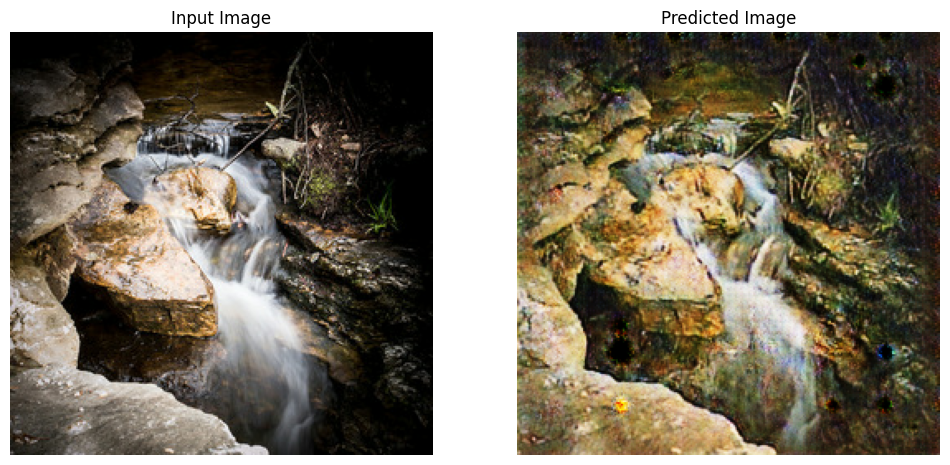

<Figure size 640x480 with 0 Axes>

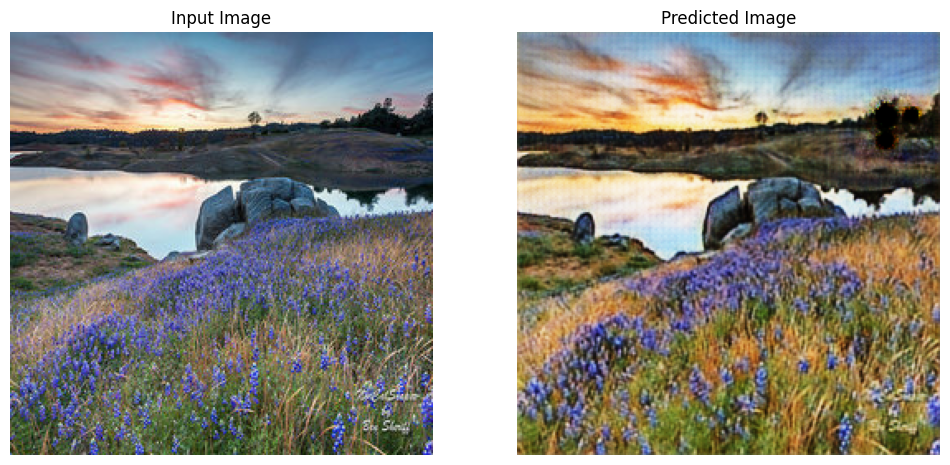

<Figure size 640x480 with 0 Axes>

In [40]:
# Run the trained model on the test dataset to generate sample outputs
for inp in test_plain_image.take(10):
  generate_images(generator_g, inp)

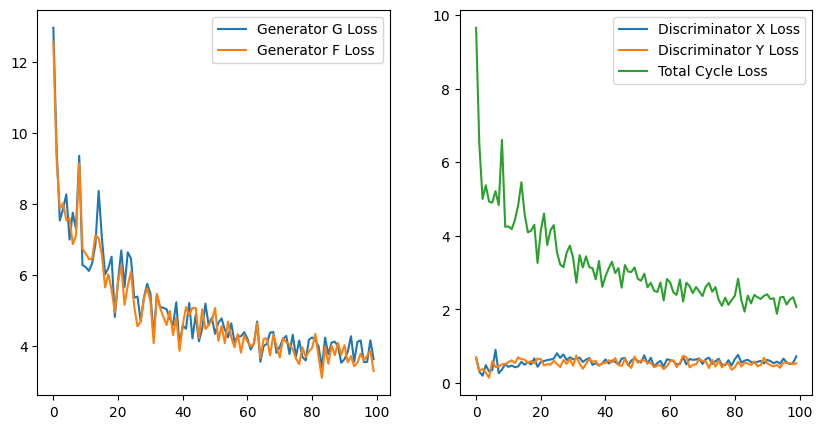

In [ ]:
# plotting the various loss functions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(total_gen_g_loss_values, label='Generator G Loss')
plt.plot(total_gen_f_loss_values, label='Generator F Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(disc_x_loss_values, label='Discriminator X Loss')
plt.plot(disc_y_loss_values, label='Discriminator Y Loss')
plt.plot(total_cycle_loss_values, label='Total Cycle Loss')
plt.legend()

plt.show()